# <center><B>DATASET</center>

1. [Importing Libraries](#importing-libraries)
2. [Loading the Dataset](#loading-the-dataset)
3. [Dataset Overview](#dataset-overview)
4. [Data Info](#data-info)
5. [Data Cleaning](#data-cleaning)
    - [Eliminating Duplicates](#eliminating-duplicates)
    - [Data Transformation: Date and Time Parsing](#data-transformation:-date-and-time-parsing)
    - [Checking for Null Values in Each Column](#checking-for-null-values-in-each-column)
    - [Dropping Unnecessary Columns](#dropping-unnecessary-columns)
    - [Examining Continuous Variables](#examining-continuous-variables)
6. [Print All Columns](#print-all-columns)
7. [Theme Setting](#theme-setting)
8. [Data Visualization: Using Plots to Find Relationships Between Features](#data-visualization)
    

<br>

 ## <b><a name="importing-libraries"></a>Importing Libraries 

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')
import folium
from folium.plugins import MarkerCluster
import webbrowser
import datetime
import plotly.express as px
from IPython.display import display

<br>

## <b><a name="loading-the-dataset"></a>Loading the Dataset


In [3]:
file_path = "database.csv"  # Update with your file path
df = pd.read_csv("C:\\Users\\DELL8\\OneDrive\\Desktop\\database.csv",dtype={25: str})

<br>

## <b><a name="dataset-overview"></a>Dataset Overview


In [4]:
df

,Date,Time,Latitude,Longitude,Type,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Type,...,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,ID,Source,Location Source,Magnitude Source,Status
0,01/02/1965,13:44:18,19.2460,145.6160,Earthquake,131.60,NaN,NaN,6.0,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860706,ISCGEM,ISCGEM,ISCGEM,Automatic
1,01/04/1965,11:29:49,1.8630,127.3520,Earthquake,80.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860737,ISCGEM,ISCGEM,ISCGEM,Automatic
2,01/05/1965,18:05:58,-20.5790,-173.9720,Earthquake,20.00,NaN,NaN,6.2,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860762,ISCGEM,ISCGEM,ISCGEM,Automatic
3,01/08/1965,18:49:43,-59.0760,-23.5570,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860856,ISCGEM,ISCGEM,ISCGEM,Automatic
4,01/09/1965,13:32:50,11.9380,126.4270,Earthquake,15.00,NaN,NaN,5.8,MW,...,NaN,NaN,NaN,NaN,NaN,ISCGEM860890,ISCGEM,ISCGEM,ISCGEM,Automatic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23407,12/28/2016,08:22:12,38.3917,-118.8941,Earthquake,12.30,1.2,40.0,5.6,ML,...,18.0,42.47,0.120,NaN,0.1898,NN00570710,NN,NN,NN,Reviewed
23408,12/28/2016,09:13:47,38.3777,-118.8957,Earthquake,8.80,2.0,33.0,5.5,ML,...,18.0,48.58,0.129,NaN,0.2187,NN00570744,NN,NN,NN,Reviewed
23409,12/28/2016,12:38:51,36.9179,140.4262,Earthquake,10.00,1.8,NaN,5.9,MWW,...,NaN,91.00,0.992,4.8,1.5200,US10007NAF,US,US,US,Reviewed
23410,12/29/2016,22:30:19,-9.0283,118.6639,Earthquake,79.00,1.8,NaN,6.3,MWW,...,NaN,26.00,3.553,6.0,1.4300,US10007NL0,US,US,US,Reviewed


<br>

## <B><a name="data-info"></a>Data Info

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23412 entries, 0 to 23411
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Date                        23412 non-null  object 
 1   Time                        23412 non-null  object 
 2   Latitude                    23412 non-null  float64
 3   Longitude                   23412 non-null  float64
 4   Type                        23412 non-null  object 
 5   Depth                       23412 non-null  float64
 6   Depth Error                 4461 non-null   float64
 7   Depth Seismic Stations      7097 non-null   float64
 8   Magnitude                   23412 non-null  float64
 9   Magnitude Type              23409 non-null  object 
 10  Magnitude Error             327 non-null    float64
 11  Magnitude Seismic Stations  2564 non-null   float64
 12  Azimuthal Gap               7299 non-null   float64
 13  Horizontal Distance         160

<br>

 ## <b><a name="data-cleaning"></a>Data Cleaning

<br>

#### <a name="eliminating-duplicates"></a>Eliminating Duplicates

In [6]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)

<br>

#### <a name="checking-for-null-values-in-each-column"></a>Checking for Null Values in Each Column





In [7]:
df.isnull().sum()

Date                              0
Time                              0
Latitude                          0
Longitude                         0
Type                              0
Depth                             0
Depth Error                   18951
Depth Seismic Stations        16315
Magnitude                         0
Magnitude Type                    3
Magnitude Error               23085
Magnitude Seismic Stations    20848
Azimuthal Gap                 16113
Horizontal Distance           21808
Horizontal Error              22256
Root Mean Square               6060
ID                                0
Source                            0
Location Source                   0
Magnitude Source                  0
Status                            0
dtype: int64

<br>

#### <a name="data-transformation:-date-and-time-parsing"></a>Data Transformation: Date and Time Parsing

In [8]:
df['Time'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce')
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['Hour'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.hour
df['Weekday'] = df['Date'].dt.day_name() 


<br>

#### <a name="dropping-unnecessary-columns"></a>Dropping Unnecessary

In [9]:
columns_to_drop = ["Depth Error", "Depth Seismic Stations", "Magnitude Error", 
    "Magnitude Seismic Stations", "Azimuthal Gap", "Horizontal Distance", 
    "Horizontal Error", "ID", "Source", "Location Source", "Magnitude Source", "Status"]
df_cleaned = df.drop(columns=columns_to_drop, axis=1)

In [10]:
critical_columns = ['Latitude', 'Longitude', 'Magnitude', 'Depth', 'Type']
df_cleaned = df_cleaned.dropna(subset=critical_columns)

In [11]:
df_cleaned_info = df_cleaned.info()
df_cleaned_head = df_cleaned.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23412 entries, 0 to 23411
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              23409 non-null  datetime64[ns]
 1   Time              23409 non-null  datetime64[ns]
 2   Latitude          23412 non-null  float64       
 3   Longitude         23412 non-null  float64       
 4   Type              23412 non-null  object        
 5   Depth             23412 non-null  float64       
 6   Magnitude         23412 non-null  float64       
 7   Magnitude Type    23409 non-null  object        
 8   Root Mean Square  17352 non-null  float64       
 9   Hour              23409 non-null  float64       
 10  Weekday           23409 non-null  object        
dtypes: datetime64[ns](2), float64(6), object(3)
memory usage: 2.0+ MB


<br>

#### <a name="examining-continuous-variables"></a>Examining Continuous Variables

In [12]:
df.describe()


,Date,Time,Latitude,Longitude,Depth,Depth Error,Depth Seismic Stations,Magnitude,Magnitude Error,Magnitude Seismic Stations,Azimuthal Gap,Horizontal Distance,Horizontal Error,Root Mean Square,Hour
count,23409,23409,23412.000000,23412.000000,23412.000000,4461.000000,7097.000000,23412.000000,327.000000,2564.000000,7299.000000,1604.000000,1156.000000,17352.000000,23409.000000
mean,1993-02-18 00:22:56.701268736,1900-01-01 11:56:43.179546368,1.679033,39.639961,70.767911,4.993115,275.364098,5.882531,0.071820,48.944618,44.163532,3.992660,7.662759,1.022784,11.449015
min,1965-01-02 00:00:00,1900-01-01 00:00:03,-77.080000,-179.997000,-1.100000,0.000000,0.000000,5.500000,0.000000,0.000000,0.000000,0.004505,0.085000,0.000000,0.000000
25%,1981-04-11 00:00:00,1900-01-01 05:58:43,-18.653000,-76.349750,14.522500,1.800000,146.000000,5.600000,0.046000,10.000000,24.100000,0.968750,5.300000,0.900000,5.000000
50%,1993-11-30 00:00:00,1900-01-01 11:54:56,-3.568500,103.982000,33.000000,3.500000,255.000000,5.700000,0.059000,28.000000,36.000000,2.319500,6.700000,1.000000,11.000000
75%,2005-09-09 00:00:00,1900-01-01 17:57:19,26.190750,145.026250,54.000000,6.300000,384.000000,6.000000,0.075500,66.000000,54.000000,4.724500,8.100000,1.130000,17.000000
max,2016-12-30 00:00:00,1900-01-01 23:59:58,86.005000,179.998000,700.000000,91.295000,934.000000,9.100000,0.410000,821.000000,360.000000,37.874000,99.000000,3.440000,23.000000
std,NaN,NaN,30.113183,125.511959,122.651898,4.875184,162.141631,0.423066,0.051466,62.943106,32.141486,5.377262,10.430396,0.188545,6.890925


<br>

#### <a name="print-all-columns"></a>Print All Columns 


In [13]:
df.columns

Index(['Date', 'Time', 'Latitude', 'Longitude', 'Type', 'Depth', 'Depth Error',
       'Depth Seismic Stations', 'Magnitude', 'Magnitude Type',
       'Magnitude Error', 'Magnitude Seismic Stations', 'Azimuthal Gap',
       'Horizontal Distance', 'Horizontal Error', 'Root Mean Square', 'ID',
       'Source', 'Location Source', 'Magnitude Source', 'Status', 'Hour',
       'Weekday'],
      dtype='object')

<br>

#### <a name="theme-setting"></a>Theme Setting

In [14]:
sns.set_theme(style="whitegrid")

<br>

### <a name="data-visualization"></a>Data Visualization

<br>

 <a name="magnitude-over-time"></a>Magnitude Over Time

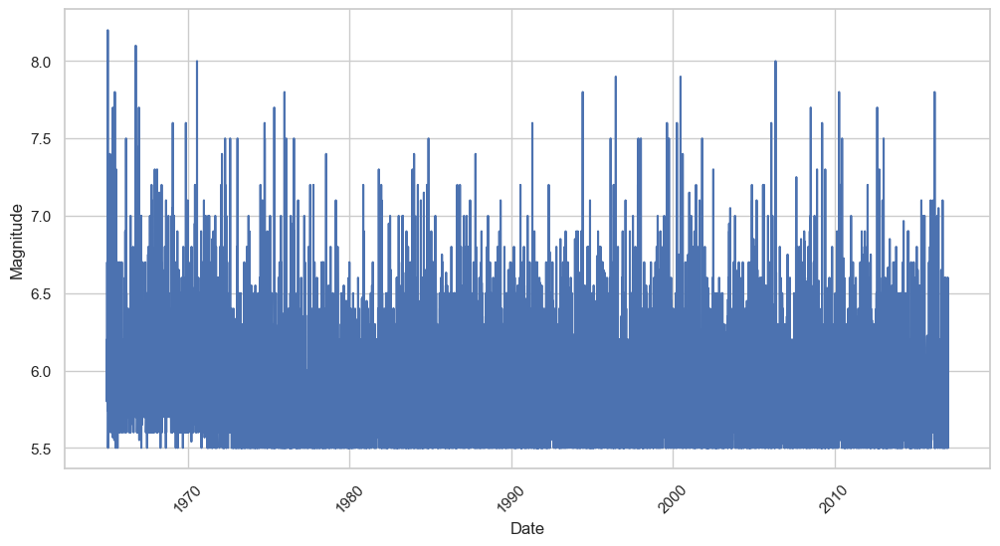

In [15]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='Date', y='Magnitude', ci=None)
plt.xticks(rotation=45)
plt.show()

<B>Observation:<br>

The line plot illustrates the trend of the Magnitude variable over time. Peaks and valleys in the plot indicate fluctuations in magnitude on specific dates, potentially corresponding to significant seismic events or other related occurrences.

<b>Conclusion:<br>

By visualizing the magnitude over time, we can identify periods of increased seismic activity. This plot helps in understanding how the magnitude varies on different dates, providing insight into patterns or anomalies that may be associated with specific events or trends.








<br>

<a name="relationships-between-magnitude-Depth-and-horizontal-distance"></a>Relationships Between Magnitude, Depth, and Horizontal Distance

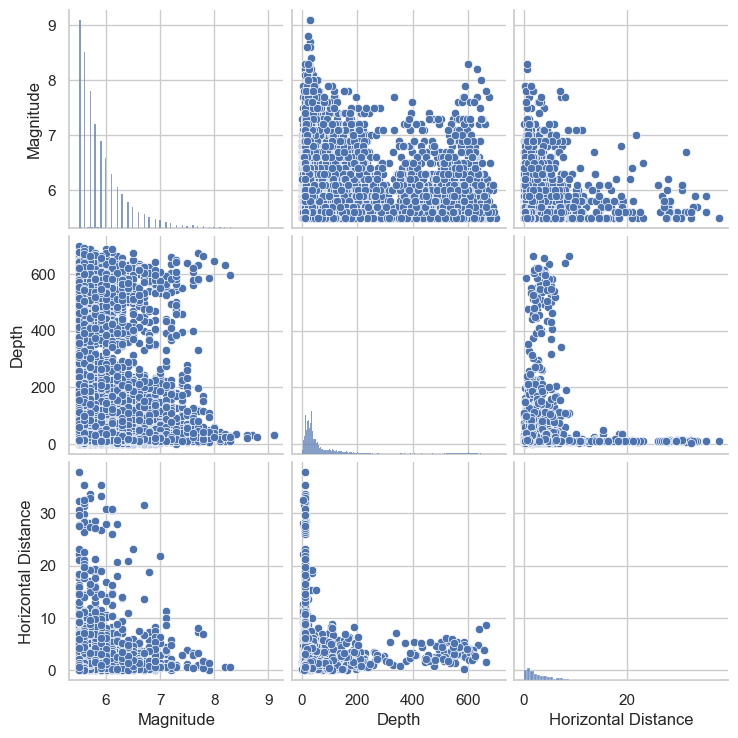

In [16]:
sns.pairplot(df[['Magnitude', 'Depth', 'Horizontal Distance']])
plt.show()

<B>Observation:<br>

The pairplot visualizes the relationships between the Magnitude, Depth, and Horizontal Distance variables. It shows the pairwise scatter plots along with the distribution of each variable. This reveals how each of these variables is distributed and how they correlate with one another.

<b>Conclusion:<br>

The pairplot suggests potential correlations between the variables, especially between Magnitude and Depth, where deeper events might be associated with higher magnitudes. The scatter plots help identify trends and outliers, providing insights into how these variables interact. Further statistical analysis could quantify the strength of these relationships and explore any hidden patterns.


<br>

<a name="magnitude-by-time-of-day"></a>Magnitude by Time of Day

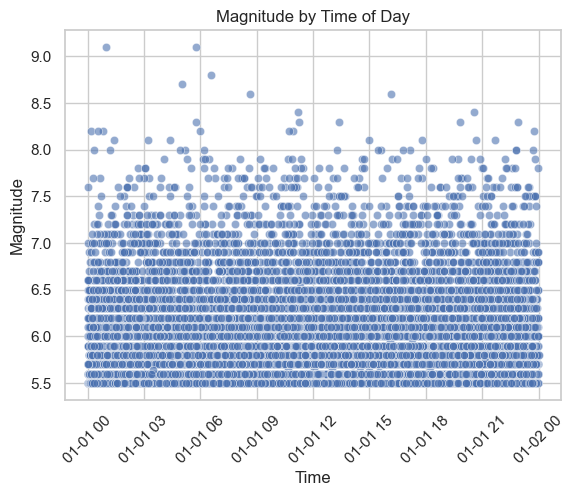

In [17]:
sns.scatterplot(x='Time', y='Magnitude', data=df,alpha=0.6)
plt.title('Magnitude by Time of Day')
plt.xticks(rotation=45)
plt.show()

<B>Observation:<br>

The scatter plot reveals how Magnitude varies throughout the day. The data points are spread across the time range, showing fluctuations in magnitude at different times, with some periods having higher or more concentrated magnitudes.

<b>Conclusion:<br>

This plot suggests that seismic or event magnitudes fluctuate at different times of the day, with no clear trend of uniformity. By analyzing the spread of magnitudes over time, we can identify specific time windows where more significant events might occur, which could be useful for understanding patterns of activity or predicting future occurrences.









<br>

<a name="time-vs-longitude"></a> Time vs Longitude

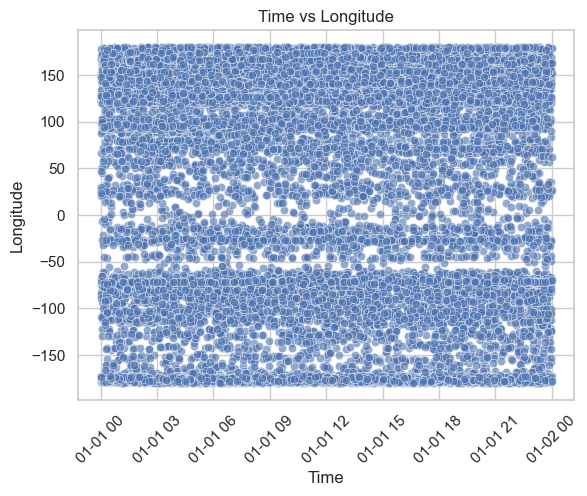

In [19]:
sns.scatterplot(data=df, x='Time', y='Longitude', alpha=0.6, palette="rocket")
plt.title("Time vs Longitude")
plt.xlabel("Time")
plt.ylabel("Longitude")
plt.xticks(rotation=45)
plt.show()


<B>Observation:<br>

The scatter plot visualizes the relationship between Time and Longitude, showing how longitude values change throughout the day. The distribution of data points indicates varying longitudes at different times, with some times having more concentrated values and others more spread out.

<b>Conclusion:<br>

This plot suggests that longitude values exhibit variability over time, potentially reflecting movements or shifts in the geographical locations of events. By analyzing the scatter of data points over time, we can identify trends or patterns in geographic distribution related to specific times of day, which could be useful for understanding spatial dynamics in the dataset.


<br>

<a name="magnitude-distribution-by-hour"></a>Magnitude Distribution by Hour

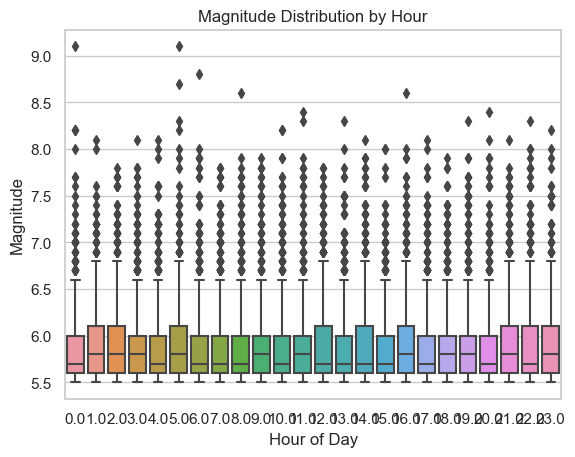

In [20]:
sns.boxplot(data=df, x='Hour', y='Magnitude')
plt.title("Magnitude Distribution by Hour")
plt.xlabel("Hour of Day")
plt.ylabel("Magnitude")
plt.show()

<B>Observation:<br>

The box plot shows how Magnitude varies across different hours of the day. It indicates that some hours experience larger magnitudes (larger interquartile ranges and higher outliers), while others have smaller or more consistent magnitudes.

<b>Conclusion:<br>

This plot suggests that seismic activity or event magnitude fluctuates throughout the day, with certain hours exhibiting more significant events. Analyzing the time-based distribution of magnitude can help in identifying patterns or peaks in seismic activity, which could be valuable for predictive modeling or resource planning.


<br>

<a name="frequency-by-hour-and-event-type"></a>Frequency by Hour and Event Type

In [22]:
hour_type_counts = df.groupby(['Hour', 'Type']).size().unstack()


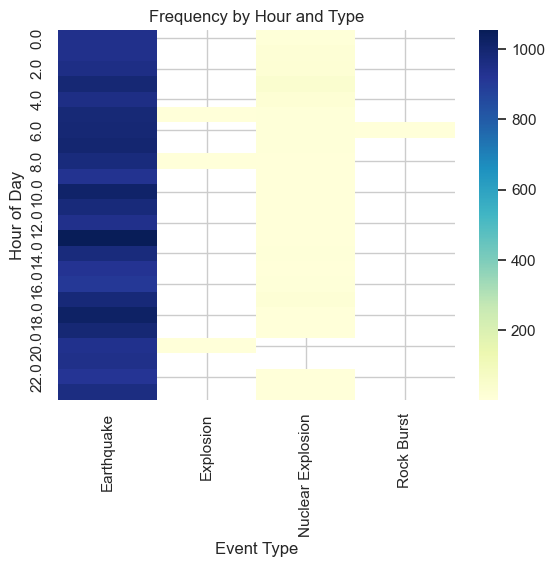

In [23]:
sns.heatmap(hour_type_counts, cmap='YlGnBu', annot=False, cbar=True)
plt.title("Frequency by Hour and Type")
plt.xlabel("Event Type")
plt.ylabel("Hour of Day")
plt.show()

<B>Observation:<br>

The heatmap visualizes the frequency of event types across different hours of the day. It shows patterns in event occurrences, highlighting which event types are more frequent at specific hours, with color intensity representing the frequency.

<b>Conclusion:<br>

This heatmap reveals the distribution of event types over the course of the day. It can help identify peak hours for specific event types, providing insights into daily trends and patterns of activity. Such information is valuable for understanding time-of-day effects or for planning resource allocation based on event occurrence patterns.


<br>

<a name="magnitude-distribution-by-weekday"></a> Magnitude Distribution by Weekday

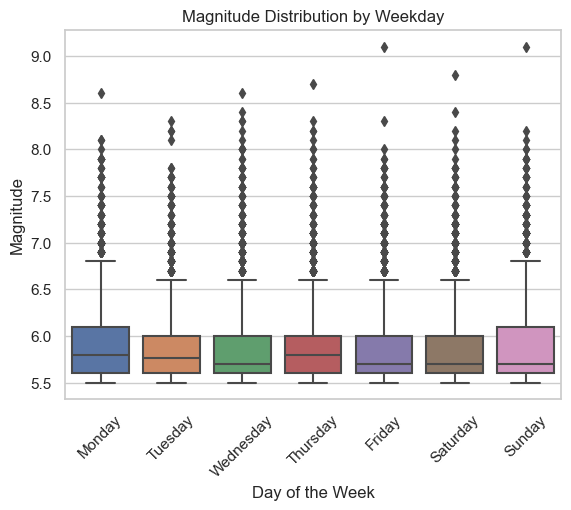

In [24]:
sns.boxplot(data=df, x='Weekday', y='Magnitude', order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title("Magnitude Distribution by Weekday")
plt.xlabel("Day of the Week")
plt.ylabel("Magnitude")
plt.xticks(rotation=45)
plt.show()

<B>Observation:<br>

The box plot shows the distribution of Magnitude across different days of the week. It reveals that certain weekdays have higher or more varied magnitudes, with some days having more outliers (indicating larger seismic events) compared to others.

<b>Conclusion:<br>

The plot suggests that the distribution of magnitudes is not uniform throughout the week, and some days might experience more significant seismic activity. This could indicate potential patterns related to specific events or cycles, which may warrant further investigation for weekly trends in magnitude.


<br>

<a name="date-vs-latitude-and-longitude"></a>Date vs Latitude and Longitude

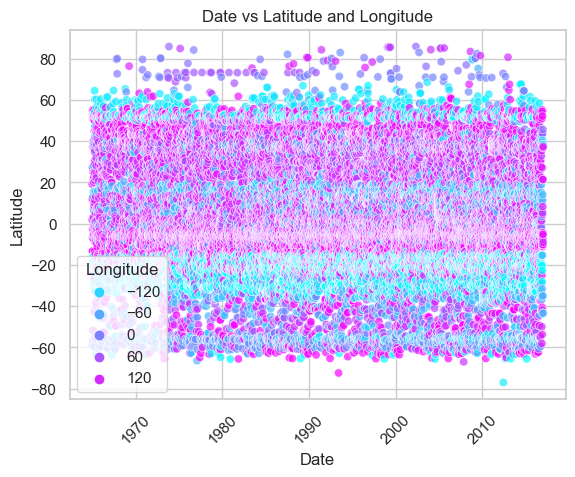

In [25]:
sns.scatterplot(data=df, x='Date', y='Latitude', hue='Longitude', palette='cool', alpha=0.7)
plt.title("Date vs Latitude and Longitude")


plt.xticks(rotation=45)
plt.show()

<B>Observation:<br>

The scatter plot shows the relationship between Date and Latitude, with the Longitude values represented by the color gradient. The plot reveals spatial patterns of events over time, with varying latitudes and longitudes across different dates.

<b>Conclusion:<br>

This plot helps visualize the geographic distribution of events over time. By color-coding longitude, it becomes easier to identify clusters or patterns in event locations. The variation in latitude and longitude over time can provide valuable insights into the spread or concentration of events across different regions.


<br>

 <a name="dept-distribution-by-month"></a>Depth Distribution by Month

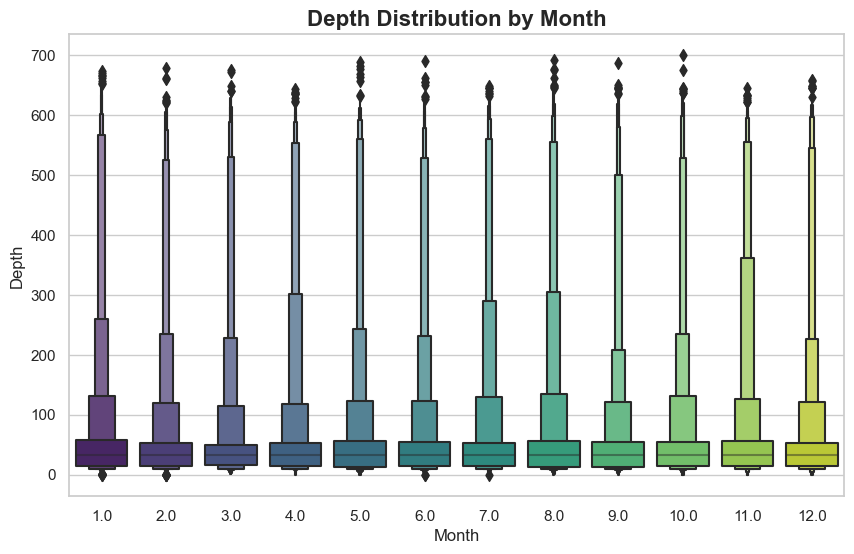

In [27]:
df['Month'] = df['Date'].dt.month  # Extract month
plt.figure(figsize=(10, 6))
sns.boxenplot(data=df, x='Month', y='Depth', palette='viridis')
plt.title("Depth Distribution by Month", fontsize=16, weight='bold')

plt.show()

<B>Observation:<br>

The boxen plot displays the distribution of Depth values across different months. It shows that the depth varies significantly, with some months exhibiting larger interquartile ranges and occasional outliers, particularly in certain months where deeper events seem more frequent.

<b>Conclusion:<br>

This plot reveals that depth distribution is not uniform across the year. Specific months may experience more intense or deeper events, while others show more consistent and shallow depths. This pattern can help identify seasonal or cyclical trends in depth, which could be useful for further investigations into environmental or geological factors.


<br>

Magnitude Type Distribution Analysis

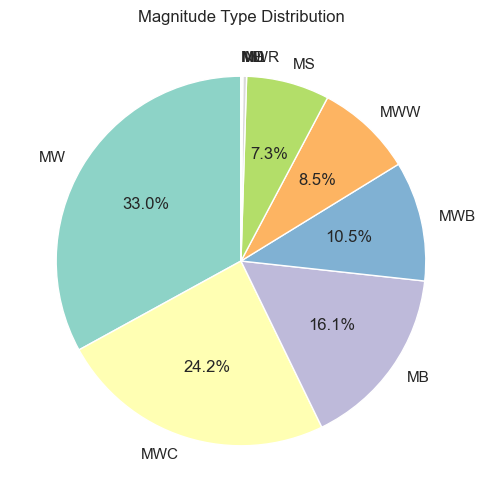

In [28]:
plt.figure(figsize=(6, 6))
def custom_autopct(pct):
    return ('%1.1f%%' % pct) if pct > 5 else ''
df['Magnitude Type'].value_counts().plot.pie(autopct=custom_autopct, startangle=90, cmap='Set3')
plt.title('Magnitude Type Distribution')
plt.ylabel('')
plt.show()

<B>Observation:<br>

The pie chart represents the distribution of different magnitude types present in the dataset. The custom_autopct function ensures that only segments with more than 5% of the total are labeled, reducing visual clutter.

<b>Conclusion:<br>

The dataset is dominated by a single magnitude type (Mw), accounting for more than 95% of the events, indicating that other magnitude types are either underrepresented or absent. This could reflect a dataset focusing specifically on this magnitude type, which is often used for standard earthquake measurements.










<br>

Customizable Pie Chart Function: create_pie_chart

In [29]:
def create_pie_chart(data, title, cmap, explode=None):
    plt.figure(figsize=(5, 5))
    data.plot.pie(
        autopct=lambda pct: ('%1.1f%%' % pct) if pct > 5 else '',
        startangle=90,
        cmap=cmap,
        explode=explode,
        textprops={'fontsize': 12, 'color': 'black'}
    )
    plt.title(title, fontsize=16)
    plt.ylabel('')
    plt.tight_layout()
    plt.show()


<br>

Distribution of Events by Hour

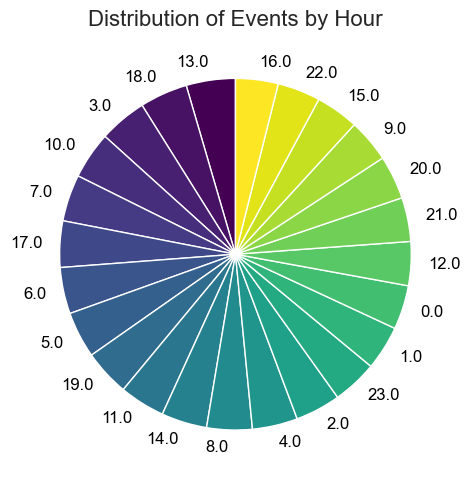

In [30]:
hour_counts = df['Hour'].value_counts()
create_pie_chart(hour_counts, 'Distribution of Events by Hour', cmap='viridis')

<B>Observation:<br>

The pie chart visualizes the frequency of events occurring during each hour of the day. Some hours may display significantly higher or lower proportions, highlighting patterns in event timing.

<b>Conclusion:<br>

The distribution of events by hour may reveal temporal trends, such as higher occurrences during specific periods (e.g., early morning or late evening). These trends could indicate natural cycles or operational influences on event reporting. Further analysis might be required to understand the causes of these patterns.


<br>

Event Distribution by Month

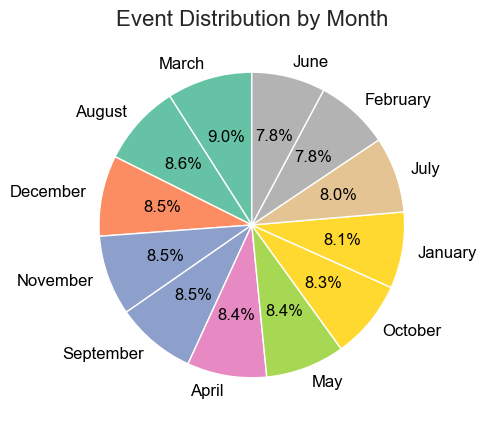

In [31]:
month_counts = df['Date'].dt.month_name().value_counts()
create_pie_chart(month_counts, 'Event Distribution by Month', cmap='Set2')

<B>Observation:<br>

The pie chart shows the distribution of events across the months of the year. Certain months may have significantly higher or lower frequencies compared to others, indicating potential seasonal or temporal variations.

<b>Conclusion:<br>

The variation in event distribution by month could reflect underlying seasonal patterns, environmental factors, or operational reporting differences. For instance, higher counts in specific months might correspond to known seasonal phenomena, whereas uniform distributions may indicate consistent event occurrences throughout the year.


<br>


Event Distribution by Day of the Week


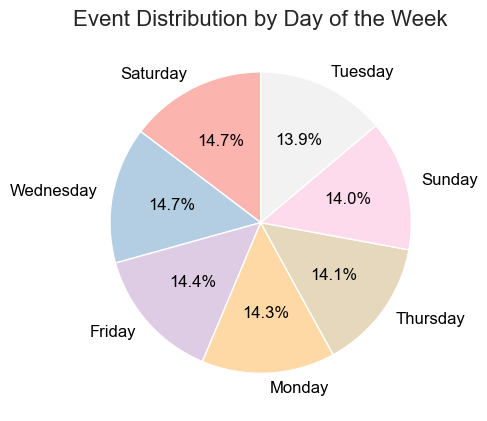

In [32]:
day_of_week_counts = df['Date'].dt.day_name().value_counts()
create_pie_chart(day_of_week_counts, 'Event Distribution by Day of the Week', cmap='Pastel1')

<B>Observation:<br>

The pie chart represents the frequency of events occurring on each day of the week. Some days may show a higher proportion of events, while others are less represented.

<b>Conclusion:<br>

The distribution of events across the week might highlight specific patterns, such as operational scheduling, natural cycles, or reporting tendencies. Peaks on certain days could point to human activity or natural phenomena tied to weekly rhythms, while uniform distributions suggest no significant weekday influence.


<br>

Latitude Distribution

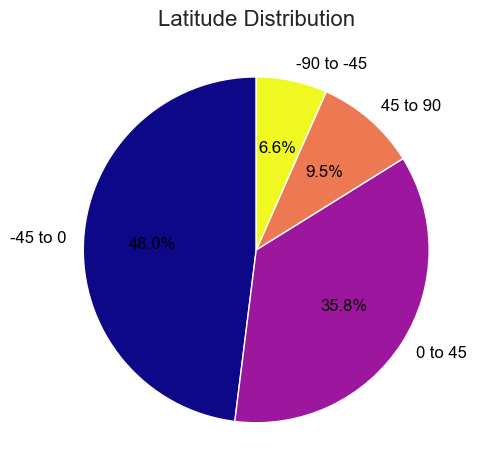

In [33]:
latitude_ranges = pd.cut(df['Latitude'], bins=[-90, -45, 0, 45, 90], labels=['-90 to -45', '-45 to 0', '0 to 45', '45 to 90'])
latitude_counts = latitude_ranges.value_counts()
create_pie_chart(latitude_counts, 'Latitude Distribution', cmap='plasma')


<B>Observation:<br>

The pie chart visualizes the distribution of events across latitude ranges, dividing the Earth's surface into four zones: -90 to -45, -45 to 0, 0 to 45, and 45 to 90. Some latitude ranges may dominate, indicating higher event concentrations in those regions.

<b>Conclusion:<br>

The distribution of events across latitudes highlights geographical clustering. For example, a concentration in the 0 to 45 range might align with tectonically active regions like the equatorial belt or specific fault zones. Sparse distributions in extreme ranges (e.g., -90 to -45) could indicate fewer natural or recorded events in polar areas.


<br>

Event Distribution by Quarter

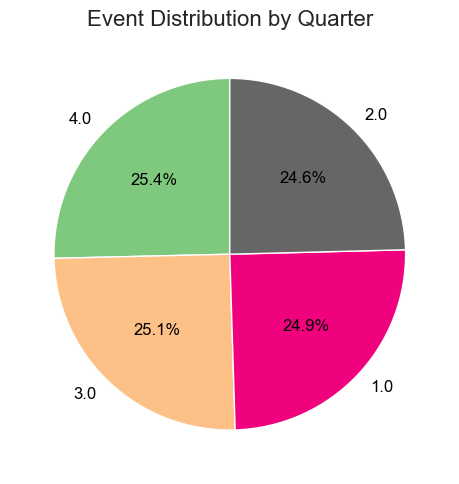

In [34]:
quarter_counts = df['Date'].dt.quarter.value_counts()
create_pie_chart(quarter_counts, 'Event Distribution by Quarter', cmap='Accent')

<B>Observation:<br>

The pie chart illustrates how events are distributed across the four quarters of the year (Q1, Q2, Q3, Q4). Each segment represents the proportion of events that occurred in the respective quarters.

<b>Conclusion:<br>

The distribution across quarters may reveal temporal trends or seasonality in event occurrences. For instance, one quarter showing higher activity could suggest seasonal environmental influences, reporting patterns, or other cyclical factors impacting the number of recorded events during that period.

<br>

 Event Occurrences Over Time

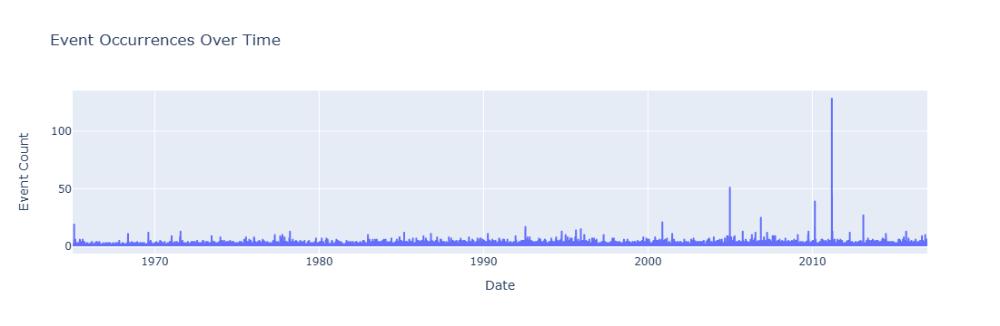

In [35]:
df['Date'] = pd.to_datetime(df['Date'])
event_by_date = df.groupby('Date').size().reset_index(name='Event Count')
fig1 = px.line(event_by_date, x='Date', y='Event Count', title='Event Occurrences Over Time')
fig1.show()


<B>Observation:<br>

The line chart shows the number of events recorded over time, highlighting fluctuations in event frequency across the observed time range. There may be identifiable trends, such as periods with increased or decreased activity.

<b>Conclusion:<br>

The observed trends in event occurrences suggest patterns or shifts in event frequency over time. These patterns could indicate natural cycles, environmental changes, or variations in reporting practices. Further analysis could help determine the underlying causes of these trends.


<br>

Custom Pie Chart Plotting Function

In [37]:
def plot_pie(data, labels, title):
    plt.figure(figsize=(6, 6))
    plt.pie(data, labels=labels, autopct='%1.1f%%', startangle=140)
    plt.title(title)
    plt.show()

<br>

Event Frequency by Weekday

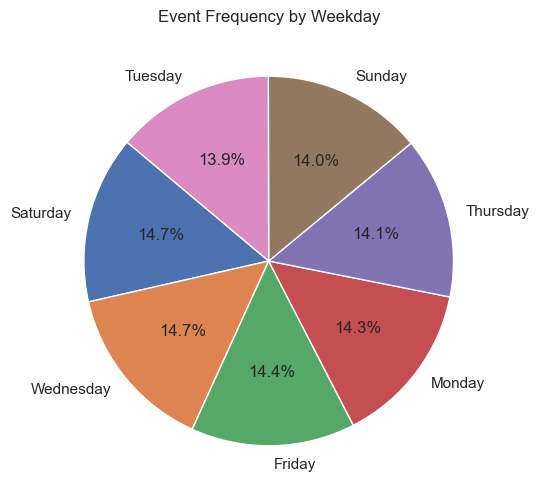

In [39]:
df['Weekday'] = df['Date'].dt.day_name()
weekday_counts = df['Weekday'].value_counts()
plot_pie(weekday_counts, weekday_counts.index, 'Event Frequency by Weekday')

<B>Observation:<br>

The pie chart represents the distribution of events across the days of the week. It shows how events are spread across weekdays and weekends, highlighting any dominant days.

<b>Conclusion:<br>

The analysis reveals patterns in event occurrences by day of the week. Certain days may show higher activity, possibly reflecting operational schedules, natural cycles, or reporting behaviors. Further investigation could help identify the factors contributing to these trends.


<br>

Distribution of Earthquake Magnitudes

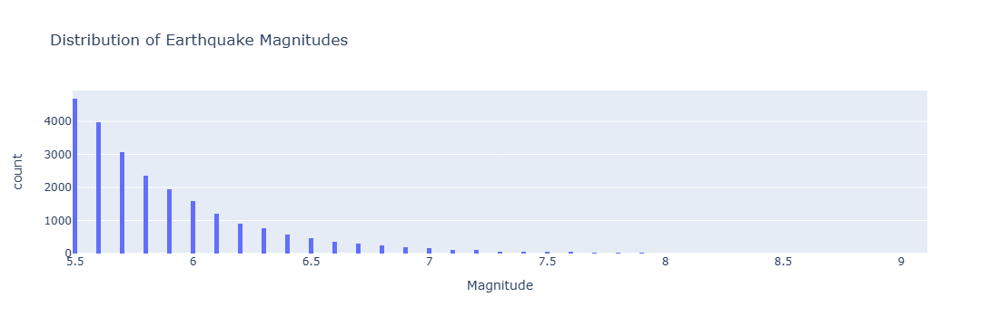

In [8]:
fig = px.histogram(df, x='Magnitude', title='Distribution of Earthquake Magnitudes')
fig.show()

<B>Observation:<br>

The histogram shows that most earthquakes have smaller magnitudes, with frequency decreasing as magnitude increases.

<b>Conclusion:<br>

Smaller magnitude earthquakes are more common, which is typical in seismic activity globally.


<br>

Earthquake Locations by Magnitude

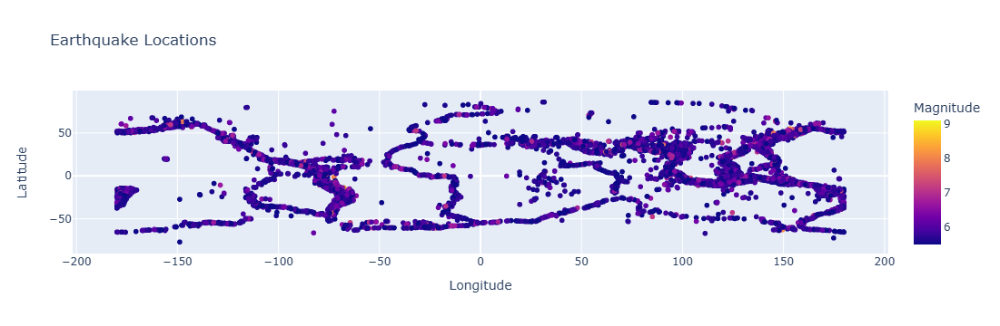

In [11]:
fig = px.scatter(df, x='Longitude', y='Latitude', color='Magnitude', title='Earthquake Locations')
fig.show()


<B>Observation:<br>

The scatter plot visualizes earthquake locations on a map, with the X-axis representing longitude and the Y-axis representing latitude. The color of the points corresponds to the magnitude, showing how larger magnitude earthquakes are distributed across different geographical regions.s.

<b>Conclusion:<br>

This plot provides a clear view of earthquake locations and their magnitudes, helping identify regions with more frequent or stronger seismic activity.


<br>

Root Mean Square (RMS) of Earthquakes Over Time

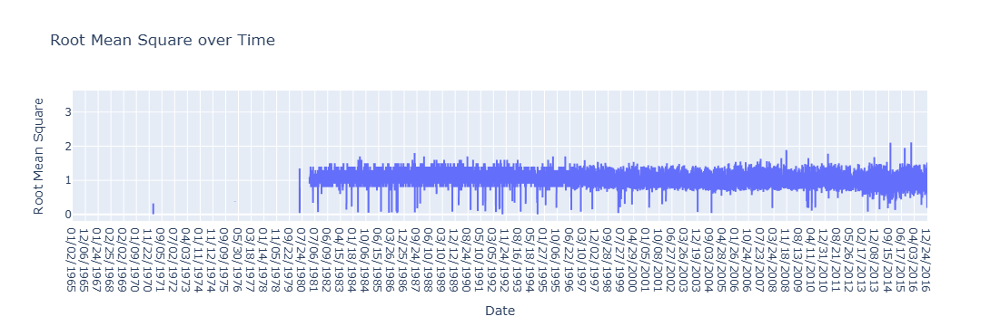

In [13]:
fig = px.line(df, x='Date', y='Root Mean Square', title='Root Mean Square over Time')
fig.show()


<B>Observation:<br>

The line plot illustrates the variation of the Root Mean Square (RMS) of earthquakes over time, with the X-axis representing dates and the Y-axis indicating the RMS values. The plot reveals fluctuations in the RMS, which can suggest changes in seismic energy over the observed period.


<b>Conclusion:<br>

This RMS plot provides insights into the intensity or energy variation of seismic events over time, highlighting periods with significant seismic activity or energy releases. Such information can be useful for analyzing the magnitude and frequency of strong seismic events.


<br>

Cumulative Earthquake Count Over Time

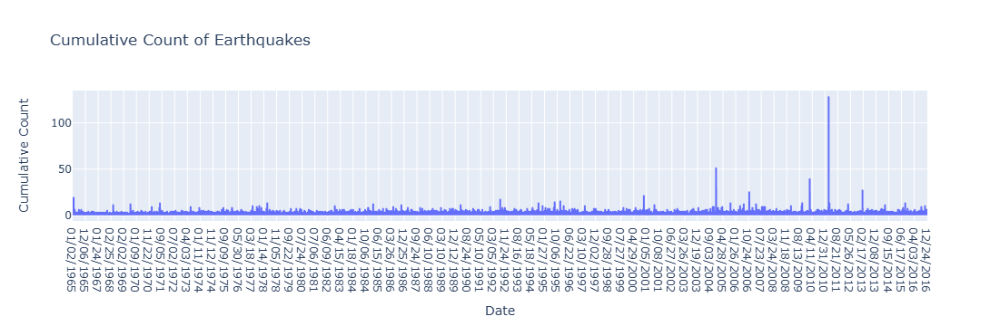

In [15]:
df['Cumulative Count'] = df.groupby('Date').cumcount() + 1
fig = px.line(df, x='Date', y='Cumulative Count', title='Cumulative Count of Earthquakes')
fig.show()

<B>Observation:<br>

The line plot shows the cumulative count of earthquakes over time, with the X-axis representing dates and the Y-axis indicating the running total of earthquakes. The plot illustrates how earthquake activity increases over the given time period, showing clear trends or patterns in seismic occurrences.

<b>Conclusion:<br>

The cumulative count plot provides a clear overview of earthquake frequency over time, helping to visualize trends in seismic activity and identify periods of increased seismic events. This can assist in recognizing potential clusters or significant seismic periods.

<br>

3D Visualization of Earthquake Locations with Magnitude

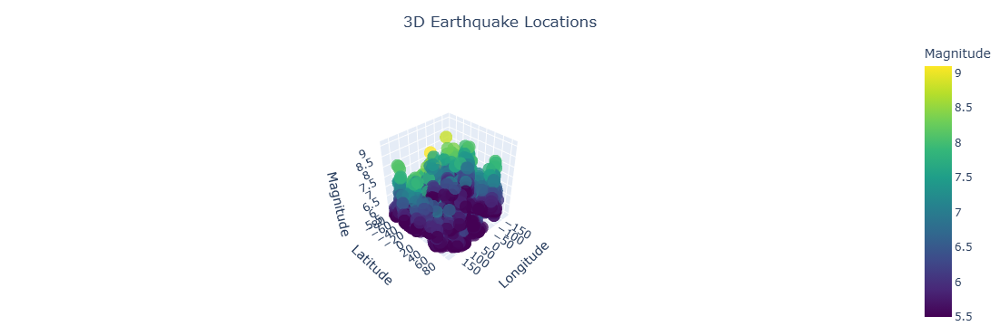

In [21]:


fig = px.scatter_3d(df, x='Longitude', y='Latitude', z='Magnitude', 
                    color='Magnitude', 
                    title='3D Earthquake Locations',
                    color_continuous_scale='Viridis',  
                    opacity=0.8,  
                    size_max=10,  
                    hover_data=['Date', 'Depth', 'Type'])  # Add more details on hover

# Customize layout for better presentation
fig.update_layout(
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Magnitude',
        aspectmode="cube"  # Maintain equal aspect ratio for all axes
    ),
    margin=dict(l=0, r=0, b=0, t=40),  # Remove margins for a cleaner look
    title_x=0.5,  # Center the title
    title_y=0.95  # Adjust title placement
)
fig.show()


<B>Observation:<br>

The plot shows earthquake locations with varying magnitudes, where color indicates magnitude intensity, and points are distributed across different latitudes and longitudes.

<b>Conclusion:<br>

This 3D visualization helps identify patterns in earthquake magnitudes and locations, aiding in the analysis of seismic activity and preparedness efforts.
